<a href="https://colab.research.google.com/github/farhanhubble/google-colab/blob/master/advanced_lane_detection_Jun21_2020.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [52]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [53]:
!ls /content/drive/My\ Drive/data_driver_view | head -10

00002207.png
00002208.png
00002209.png
00002210.png
00002211.png
00002212.png
00002213.png
00002214.png
00002215.png
00002216.png


In [54]:
def plot_img_grid(images, nb_cols,row_height=4):
    nb_images = len(images)
    nb_rows = int(np.ceil(nb_images/nb_cols))
    
    for i in range(nb_rows):
        plt.figure(figsize=(32, row_height))
        for j in range(nb_cols):
            image_index = i*nb_cols + j
            if image_index >= nb_images:
              break

            plt.subplot(1, nb_cols, j+1) 
            image = images[image_index]
            nb_channels = 1 if len(image.shape) == 2 else image.shape[-1]
            plt.imshow(image, cmap='gray' if nb_channels == 1 else None)
            plt.xticks([])
            plt.yticks([])
        plt.show()

In [55]:
import os
from glob import glob
from tqdm import tqdm

data_cache = '/content/drive/My Drive/data_driver_view/road_data.npy'
if os.path.exists(data_cache):
  print('Loading data from cache...')
  road_data = np.load(data_cache)
  print(f'Data with dimensions {road_data.shape} loaded.')
else:
  road_data = []
  os.makedirs('./cache',exist_ok=True)
  filenames = glob('/content/drive/My Drive/data_driver_view/*.png')
  print('Loading data from Google Drive')
  for name in tqdm(filenames):
    img_bgr = cv2.imread(name)
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    road_data.append(img_rgb)
  road_data = np.array(road_data)
  np.save(data_cache,road_data)
  print(f'{len(road_data)} images loaded')

Loading data from cache...
Data with dimensions (355, 720, 1280, 3) loaded.


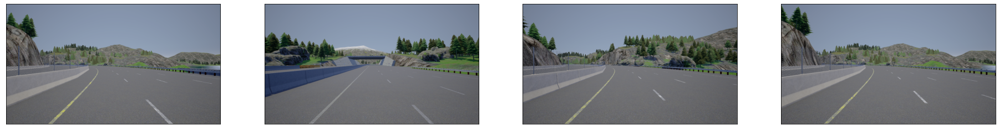

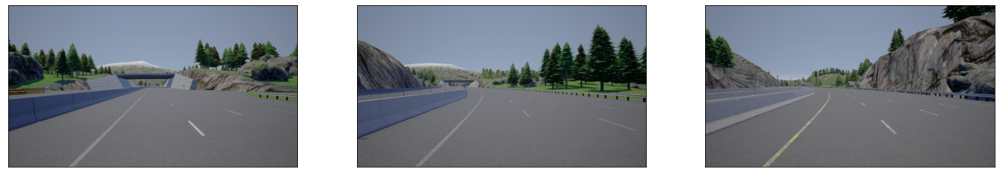

In [56]:
# Plot a few random data points
indices = list(range(len(road_data)))
random_indices = np.random.choice(indices,7)
plot_img_grid(road_data[random_indices],4)

In [57]:
grad_x = cv2.Sobel(road_data[0], cv2.CV_32F, 1, 0)
grad_y = cv2.Sobel(road_data[0], cv2.CV_32F, 0, 1)

abs_grad_x = abs(grad_x)
abs_grad_y = abs(grad_y)

#Scale gradients channel-wise, ensure zero gradients map to zero 
max_channelwise_x = np.max(abs_grad_x, axis=(0,1))
max_channelwise_y = np.max(abs_grad_y, axis=(0,1))


grad_x_scaled = (abs_grad_x)/(max_channelwise_x )
grad_y_scaled = (abs_grad_y)/(max_channelwise_y )
grad_x_y_scaled = np.sqrt(grad_x_scaled**2+grad_y_scaled**2)/2**.5

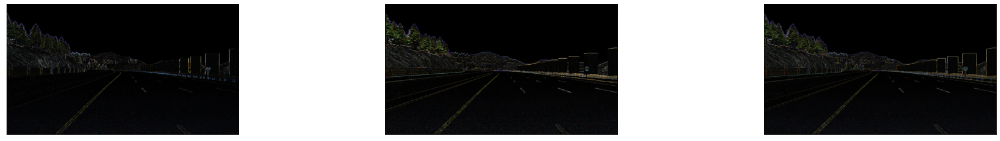

In [58]:
plot_img_grid([grad_x_scaled, 
               grad_y_scaled,
               grad_x_y_scaled]
              ,3)

In [59]:
# Convert to binary value.
# Otsu's requires intensities 
grad_x_rescaled = (grad_x_scaled * 255).astype(np.uint8)
grad_y_rescaled = (grad_y_scaled * 255).astype(np.uint8)
grad_x_y_rescaled = (grad_x_y_scaled * 255).astype(np.uint8)

_, bin_grad_x = cv2.threshold(grad_x_rescaled[:,:,0], 0, 255, cv2.THRESH_OTSU+cv2.THRESH_BINARY)
_, bin_grad_y = cv2.threshold(grad_y_rescaled[:,:,0], 0, 255, cv2.THRESH_OTSU+cv2.THRESH_BINARY)
_, bin_grad_x_y = cv2.threshold(grad_x_y_rescaled[:,:,0], 0, 255, cv2.THRESH_OTSU+cv2.THRESH_BINARY)

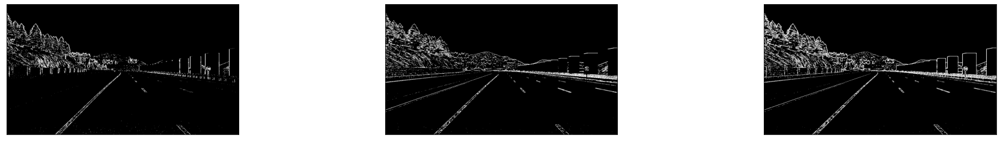

In [60]:
plot_img_grid([bin_grad_x,
               bin_grad_y,
               bin_grad_x_y],3);

In [46]:
#find the connected components
retval, labels, stats, centroids = cv2.connectedComponentsWithStats(bin_grad_x_y)

# Find the top 10 components
top_components_index = np.argsort(stats[:, -1])[-1:-31:-1]
top_components = stats[top_components_index, -1]


# Plot the connected components
components = []
for component_id in top_components_index:
  condition_array = np.rollaxis(np.stack((labels == component_id, labels == component_id, labels == component_id)), 0, 3)
  component = np.where(condition_array, road_data[0], np.zeros_like(road_data[0]))
  components.append(component)

In [ ]:
plot_img_grid(components, 1, row_height=20)

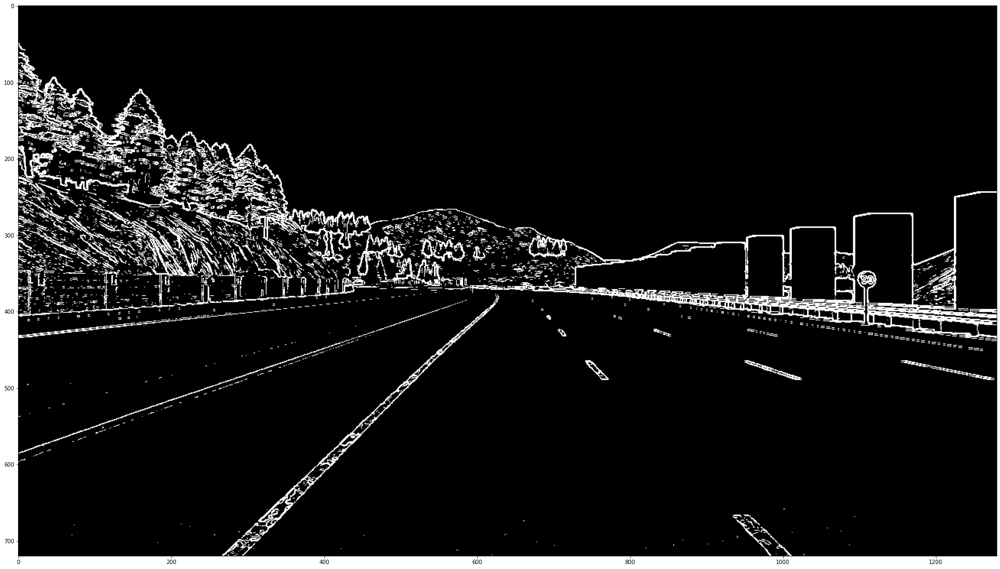

In [61]:
plt.figure(figsize=(32,20))
plt.imshow(bin_grad_x_y, cmap='gray')
plt.show()

In [82]:
contours, hierarchy = cv2.findContours(bin_grad_x_y,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_TC89_L1,)

In [88]:
len(hierarchy[0])

1672

In [84]:
list(map(len, contours))[:10]

[1, 1, 1, 1, 1, 1, 2, 1, 2, 1]

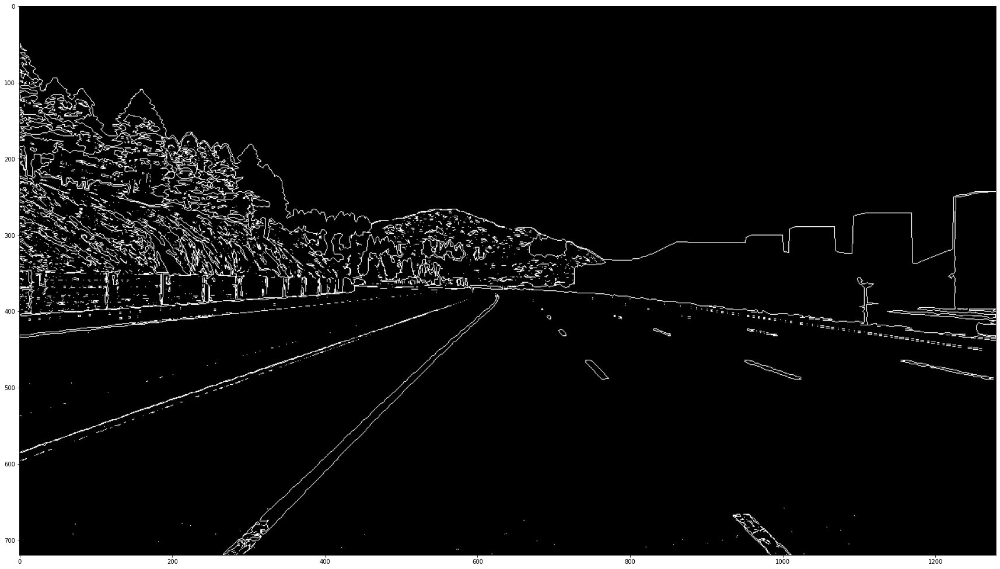

In [85]:
blank = np.zeros_like(bin_grad_x_y)
cv2.drawContours(blank,contours,-1,(255,0,0),1)
plt.figure(figsize=(30,20))
plt.imshow(blank, cmap='gray')
plt.show()

In [89]:
contour_lens = list(map(len, contours))

In [93]:
indices_by_len = np.argsort(contour_lens)

In [95]:
contours_by_size = np.array(contours)[indices_by_len]

In [102]:
len(contours_by_size[-1])

1680

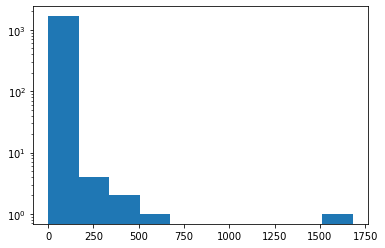

In [104]:
plt.hist(list(map(len, contours_by_size)), log=True);

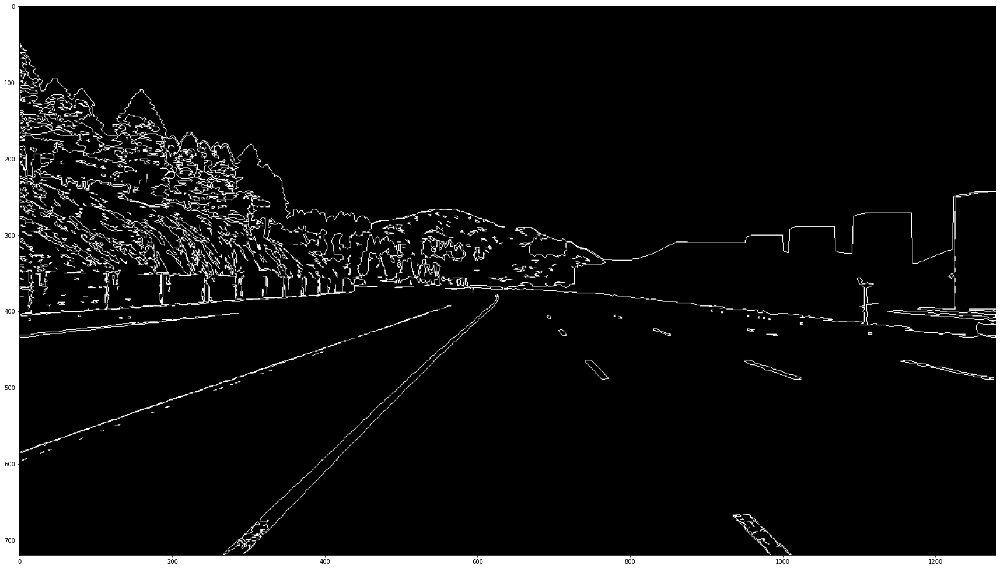

In [109]:
blank1 = np.zeros_like(bin_grad_x_y)
cv2.drawContours(blank1,contours_by_size[1300:],-1,(255,0,0),1)
plt.figure(figsize=(30,20))
plt.imshow(blank1, cmap='gray')
plt.show()

In [135]:
boundaries = []
min_boxes = []
for cnt in contours:
  perimeter = cv2.arcLength(cnt, True)
  if perimeter > 20:
    boundary = cv2.approxPolyDP(cnt, perimeter*0.05, True)
    box = cv2.minAreaRect(cnt)
    box = cv2.boxPoints(box)
    box = np.int0(box)
    min_boxes.append(box)
    boundaries.append(boundary)

((300.5, 710.0000610351562), (21.920310974121094, 4.949747562408447), -45.0)
[[294.5     719.50006]
 [291.      716.00006]
 [306.5     700.50006]
 [310.      704.00006]]
((291.0953674316406, 704.4368896484375), (55.13719177246094, 12.979984283447266), -19.440034866333008)
[[267.25845 719.73224]
 [262.93845 707.49225]
 [314.93228 689.14154]
 [319.2523  701.38153]]
((989.7642211914062, 701.8431396484375), (6.034632682800293, 54.48833084106445), -47.38594055175781)
[[1007.7711   722.5095 ]
 [ 967.6715   685.6178 ]
 [ 971.7573   681.17676]
 [1011.85693  718.0685 ]]
((303.25, 687.2500610351562), (28.284271240234375, 4.9497480392456055), -45.0)
[[295.      699.00006]
 [291.5     695.50006]
 [311.5     675.50006]
 [315.      679.00006]]
((959.2501220703125, 677.7500610351562), (3.535533905029297, 11.31370735168457), -45.0)
[[962.0001  683.00006]
 [954.0001  675.00006]
 [956.5001  672.50006]
 [964.5001  680.50006]]
((964.2914428710938, 692.801513671875), (9.658411026000977, 65.06845092773438),

In [133]:
len(min_boxes)

189

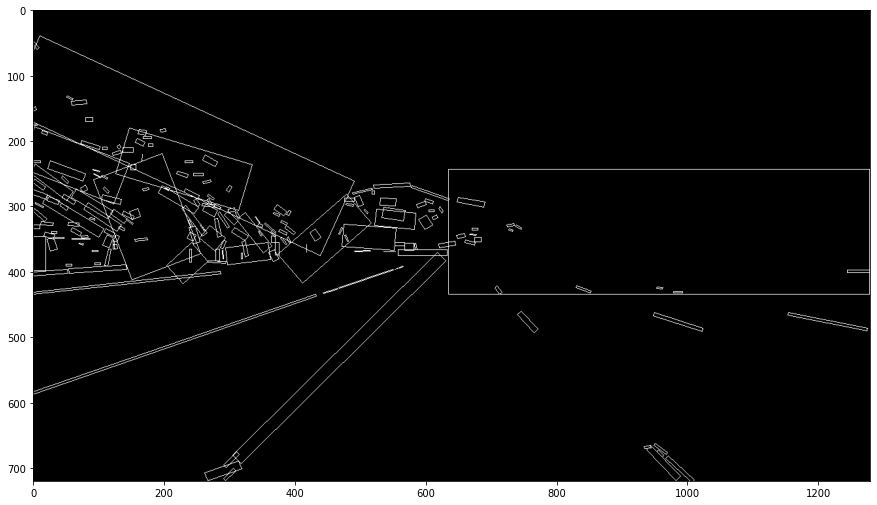

In [134]:
blank2 = np.zeros_like(bin_grad_x_y)
cv2.drawContours(blank2, min_boxes, -1, (255,0,0),1)
plt.figure(figsize=(15,10))
plt.imshow(blank2, cmap='gray');

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


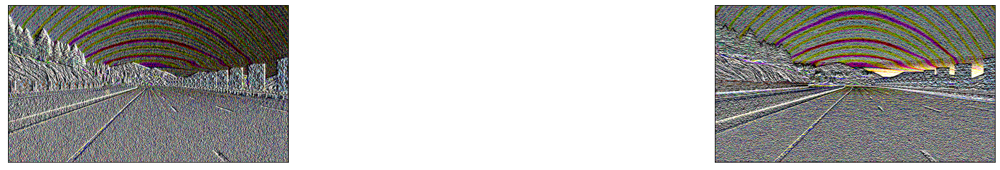

In [137]:
plot_img_grid([grad_x, 
               grad_y]
              ,2)

In [189]:
import scipy as sp

In [192]:
from scipy import stats

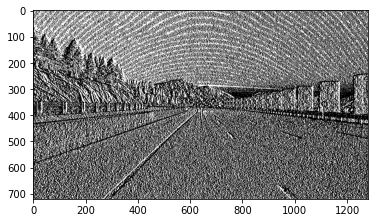

In [339]:
grad_ratio = np.arctan2(grad_y, grad_x)
abs_grad_ratio = np.abs(grad_ratio)
scaled_grad_ratio = abs_grad_ratio / abs_grad_ratio.max(axis=(0,1)) 
#mode = stats.mode(scaled_grad_ratio[...,0])
#plt.figure(figsize=(30,20))
plt.imshow((scaled_grad_ratio[...,0]**5<0.01).astype(np.uint8)*255, cmap='gray');

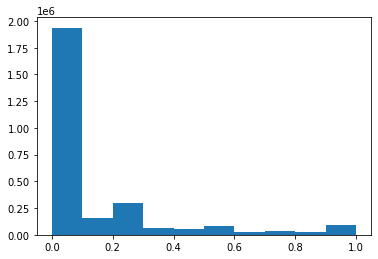

In [332]:
plt.hist(scaled_grad_ratio.ravel()**5);

In [201]:
mode.mode

array([[0.5 , 0.75, 0.5 , ..., 0.75, 0.75, 0.5 ]], dtype=float32)

In [203]:
from sklearn.cluster import DBSCAN

In [208]:
dbscan = DBSCAN(min_samples=5)

In [209]:
clusters = dbscan.fit(scaled_grad_ratio[...,0])

In [210]:
clusters.labels_

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1

In [214]:
retval, labels, stats, centroids = cv2.connectedComponentsWithStats((scaled_grad_ratio[...,0]*255).astype(np.uint8))
# Find the top 10 components
top_components_index = np.argsort(stats[:, -1])[-1:-31:-1]
top_components = stats[top_components_index, -1]


# Plot the connected components
components = []
for component_id in top_components_index:
  condition_array = np.rollaxis(np.stack((labels == component_id, labels == component_id, labels == component_id)), 0, 3)
  component = np.where(condition_array, road_data[0], np.zeros_like(road_data[0]))
  components.append(component)

In [222]:
stats

array([[     0,      0,   1280,    720, 116582],
       [     0,      0,   1280,    720, 804695],
       [    32,      0,      3,      2,      4],
       [   383,      0,      5,      2,      6],
       [   415,      0,      3,      2,      4],
       [   514,      0,      3,      3,      5],
       [   519,      0,      3,      3,      5],
       [   613,      0,      7,      3,     10],
       [   633,      0,      3,      3,      5],
       [   643,      0,      3,      2,      4],
       [   648,      0,      5,      3,      7],
       [   663,      0,      3,      3,      5],
       [   667,      0,      4,      3,      8],
       [   679,      0,      3,      3,      5],
       [    35,      3,      2,      1,      2],
       [   513,      4,      3,      3,      7],
       [   517,      4,      5,      3,     11],
       [  1266,      6,      3,      3,      7],
       [   709,      8,      3,      3,      7],
       [   573,     11,      3,      3,      7],
       [   719,     

In [230]:
grad_grad_x_y = cv2.Sobel(scaled_grad_ratio,cv2.CV_32F, 1, 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


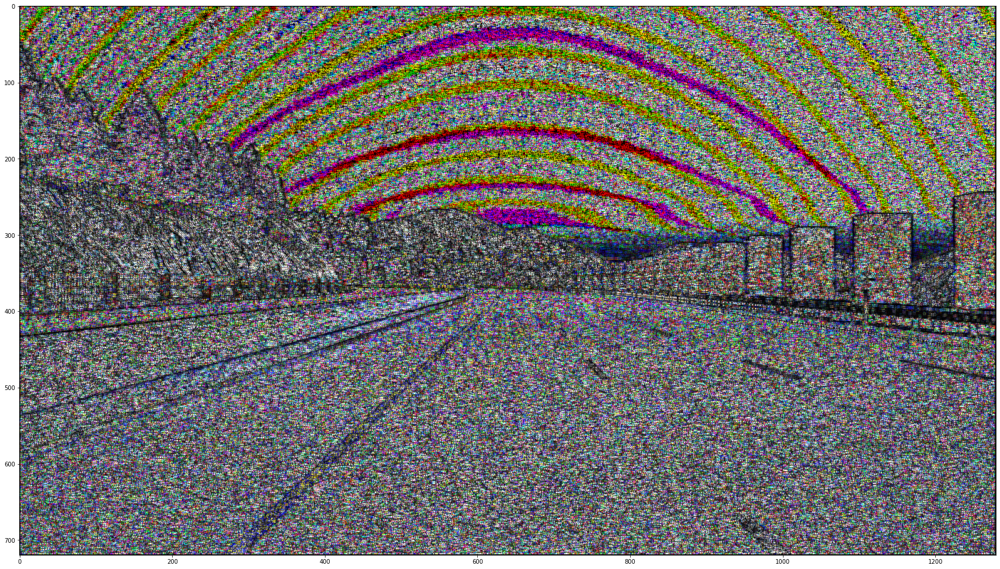

In [236]:
plt.figure(figsize=(30,20))
plt.imshow(abs(grad_grad_x_y))

In [232]:
grad3_x_y = cv2.Sobel(grad_grad_x_y,cv2.CV_32F,1,1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


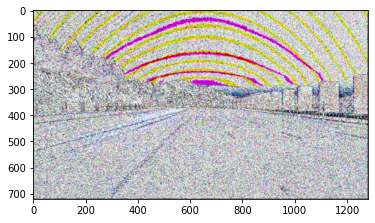

In [233]:
plt.imshow(abs(grad3_x_y))

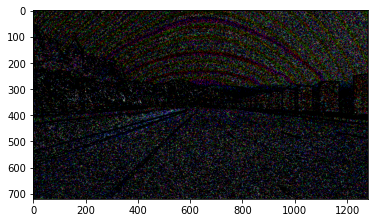

In [270]:
plt.imshow((np.abs(grad_grad_x_y)>1).astype(np.uint8)*255)

(array([  7735.,  44816., 151007., 399204., 664438., 900019., 393368.,
        149436.,  47913.,   6864.]),
 array([-2. , -1.6, -1.2, -0.8, -0.4,  0. ,  0.4,  0.8,  1.2,  1.6,  2. ],
       dtype=float32),
 <a list of 10 Patch objects>)

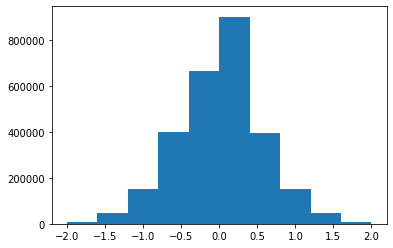

In [246]:
plt.hist(grad_grad_x_y.ravel())

(array([1120300.,       0.,       0.,       0.,       0.,       0.,
              0.,       0.,       0., 1644500.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

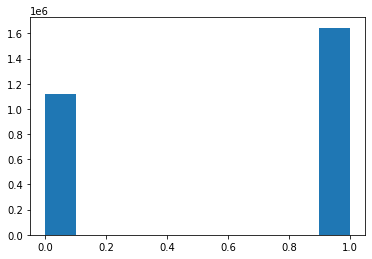

In [258]:
plt.hist((grad_grad_x_y<0.1).astype(np.uint8).ravel())

In [259]:
x = (grad_grad_x_y<0.1).astype(np.uint8)

In [260]:
x

array([[[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 1, 0],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 0],
        [0, 1, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [1, 1, 1]],

       ...,

       [[1, 1, 1],
        [0, 1, 1],
        [1, 1, 0],
        ...,
        [1, 1, 0],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [0, 1, 0],
        [1, 1, 0],
        ...,
        [1, 0, 0],
        [1, 1, 1],
        [1, 1, 1]],

       [[1, 1, 1],
        [1, 1, 1],
        [1, 1, 1],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)

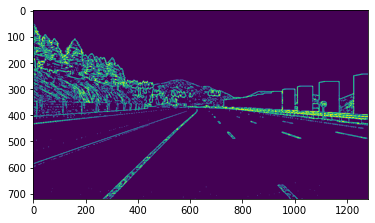

In [297]:
plt.imshow(np.logical_and(scaled_grad_ratio[...,0],bin_grad_x_y).astype(np.uint8)*255); 

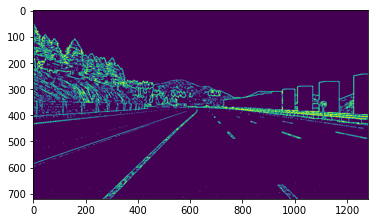

In [298]:
plt.imshow(bin_grad_x_y);

(array([2.637821e+06, 8.439400e+04, 2.353300e+04, 9.039000e+03,
        4.536000e+03, 2.710000e+03, 1.421000e+03, 8.310000e+02,
        4.010000e+02, 1.140000e+02]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ],
       dtype=float32),
 <a list of 10 Patch objects>)

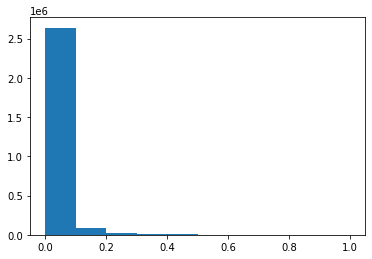

In [284]:
plt.hist(grad_x_scaled.ravel())

In [285]:
0.0 and 0.0

0.0

In [286]:
np.logical_and([0.0],[0.0])

array([False])

In [291]:
y = np.logical_and(scaled_grad_ratio[0,:20],grad_x_scaled[0,:20])

In [292]:
np.sum(y)

9

In [294]:
scaled_grad_ratio[0,:20]

array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       [1., 0., 0.],
       [0., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 0.]], dtype=float32)

In [295]:
grad_x_scaled[0,:20]

array([[0.        , 0.        , 0.        ],
       [0.00406504, 0.        , 0.00372439],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        ],
       [0.00406504, 0.00402414, 0.00372439],
       [0.00406504, 0.00804829, 0.00744879],
       [0.00406504, 0.00402414, 0.        ],
       [0.        , 0.00402414, 0.        ],
       [0.        , 0.00402414, 0.00372439],
       [0.        , 0.        , 0.00372439],
       [0.        , 0.        , 0.00372439],
       [0.        , 0.00402414, 0.00372439],
       [0.00406504, 0.        , 0.        ],
       [0.        , 0.00402414, 0.        ],
       [0.00406504, 0.00402414, 0.00372439],
       [0.00406504, 0.        , 0.        ],
       [0.        , 0.00402414, 0.        ],
       [0.00406504, 0.        , 0.        ],
       [0.        , 0.00402414, 0.        ]], dtype=float32)